# Introduction
Cyclo-oxygenase (COX) is an enzyme that results in the formation of prostanoids, e.g. prostaglandins, whcih play a role in inflammatory responses and homeostasis.[1] COX catalyzes arachidonic acid conversion into prostaglandins (PGs).[2] PG receptors are members of the G-protein coupled receptor family and play a role in different body areas. They are highly lipohilic and bind to prostaglandin receptors through a prostaglandin transporter (PGT).[9, 10] PGs cause downstream effects by activating secondary signaling pathways (e.g. adenyl cyclase).[9] Their function in different body areas include vaso-dilation and -constriction in vascular smooth muscle cells, platelet aggregation, hormone regulation, etc.[9] Another point of interest is their effect on the central nervous system, causing fever and even influencing pain perceptions. 

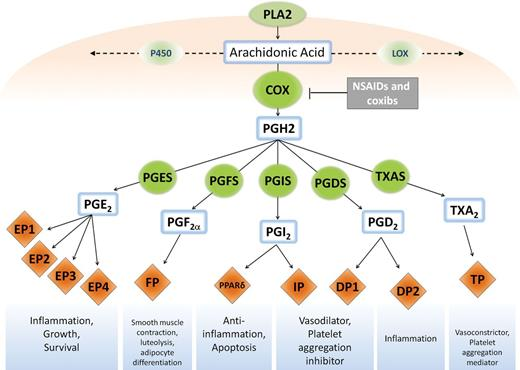

**Figure 1.** [1,3] 

There are two known isomers of cyclo-oxygenase, cyclo-oxygenase 1 and cyclo-oxygenase 2. COX-1 is known as the constitutive form to maintain homeostasis, while COX-2 is inducible and mostly expressed when the inflammatory response is activated.[2,4] Examples of several pathways influenced by COX2 enzymes are JNK signaling, reactive oxygen, several kinase pathways and NF-κB.[4] 

## Structure
COX1 and COX2 differ in physiological function but do share 60% of their total amino acid sequence, and both are responsible for the production of prostaglandines.[4, 5] Human COX-1 contains 576 amino acids, while human COX-2 contains 604 since COX-2 contains a fourth oligosaccharide that regulates degradation [5,7].  

## COX2 inhibitors
There are several COX-2 inhibitors known, non-selective nonsteroidal anti-inflammatory drugs (NSAIDs), COX-2 selective NSAIDS and aspirin.[1,4,8] Examples of COX inhibiting NSAIDs are Ibuprofen, Naproxen, Diclofenac, Celecoxib and Rofecoxib[8], all which bind non-covalently to the receptor binding site. Aspirin (acetyl salicylic acid), another well-prescribed alnagesic is unique since its binding involves a covalent acetylation of Ser-530.[11] Non-selective NSAIDs inhibit both COX-1 and COX-2, resulting in changes in homeostasis regulation, often causing adverse effects. These adverse effects caused by non-selective inhibitors indicate the need  

## References

1) https://academic.oup.com/bjaed/article/13/4/131/345292?login=true
2) https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4688592/
3) 	Cebola I,  Peinado M. Epigenetic deregulation of the COX pathway in cancer, Prog Lipid Res, 2012, vol. 51 (pg. 301-3)
4) https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1571744/
5) https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2674713/
6) https://pubmed.ncbi.nlm.nih.gov/10966456/
7) https://www.ncbi.nlm.nih.gov/pmc/articles/PMC49714/
8) https://www.ncbi.nlm.nih.gov/books/NBK549795/
9) https://www.ncbi.nlm.nih.gov/books/NBK553155/
10) Hata AN, Breyer RM. Pharmacology and signaling of prostaglandin receptors: multiple roles in inflammation and immune modulation. Pharmacol Ther. 2004 Aug;103(2):147-66.
11) https://pubs.acs.org/doi/10.1021/acs.biochem.5b01378

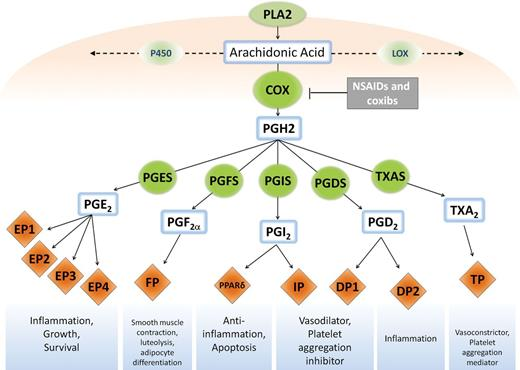
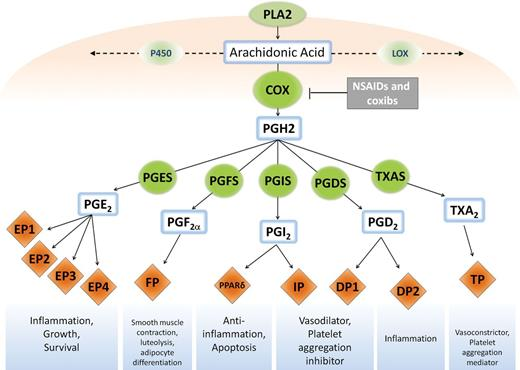
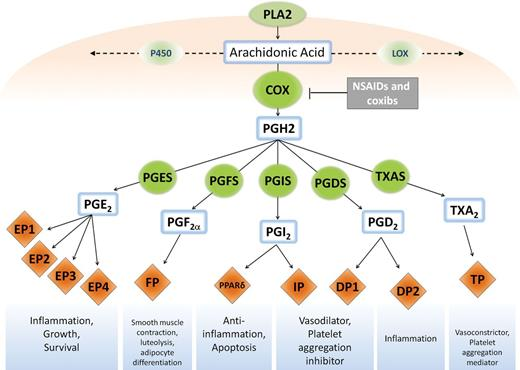

In [1]:
!pip install biopython==1.81

In [2]:
## This code block imports python modules to work with during the lab, you need to run it first to get started.
# modules
import py3Dmol
import nglview
import os
import shutil
#from Bio.PDB import PDBParser, PDBIO, Select,  PDBList, MMCIFParser, StructureAlignment
from Bio.PDB import PDBList, MMCIFParser, Select, PDBIO
import Bio.Align
import os
from pathlib import Path
import rdkit

# local scripts
from scripts import viewer
from scripts import bio_align

/opt/conda/lib/python3.11/site-packages/Bio/pairwise2.py:278: BiopythonDeprecationWarning: Bio.pairwise2 has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.PairwiseAligner as a replacement, and contact the Biopython developers if you still need the Bio.pairwise2 module.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/Bio/Data/SCOPData.py:18: BiopythonDeprecationWarning: The 'Bio.Data.SCOPData' module will be deprecated in a future release of Biopython in favor of 'Bio.Data.PDBData.
  warnings.warn(



### Related proteins (off-targets), based on sequence

We start with finding our own target using UniProt, a public database containing the genomic information of many proteins.[11] Our target (COX2) with accession number `P35354` has a length of 604 AA, a mass of 68.996 kDa and is marked with a yellow star (it is a Swiss-Prot expert reviewed target deemed correct). An identical protein in another species is found using the Basic Local Alignment search Tool (BLAST).[12] The related target is found in rabbits, accession number `O02768`, with a length of 604 amino acids. COX-2 found in rabbits is 89.9% similar to the human COX-it 2 target and has a mass of 69.007 kDa. 

The most similar human off-target is prostaglandin G/H synthase 1 (COX-1) (`P23219`). The total sequence identity with COX-2 according to BLASTis 64.7%. 

`O02768`, COX-2 in rabbits, showed a higher similarity score with our target than prostaglandin synthase 1 (COX1). This was expected since COX1, as previously discussed, plays more of a role in homeostasis while COX2 is more involved in inflammation.[2,4] Evidently, this physiological role division has been conserved in mammals, since the remarkably high sequence identity indicates a shared function in humans and rabbits.[13]

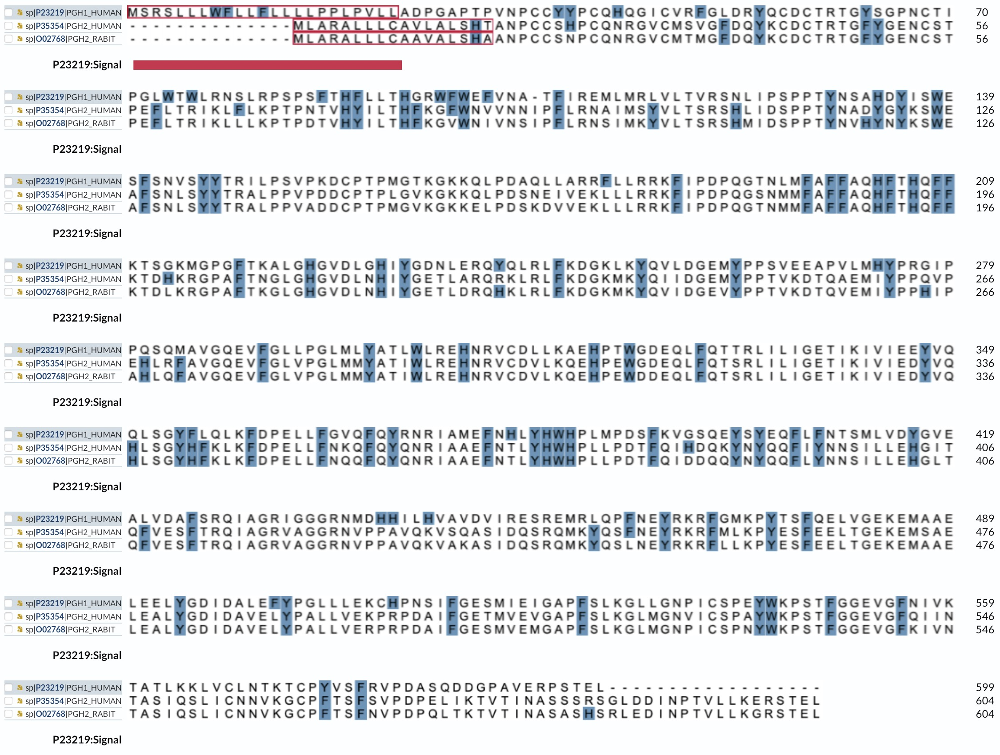
**Figure 2.** Protein alignment using BLAST

    

### Related proteins (off-targets), based on structure

Now we look into the 3D crystal structure to determine structural similarity. The PDB identifier is used to determine the accession number of the most similar structure compared to our target COX2. COX2 (5F1A) is compared with 4O1Z, with a realignment RMSD of 0.8070. 

11) http://www.uniprot.org/.
12) https://www.uniprot.org/blast
13) https://onlinelibrary.wiley.com/doi/10.1111/jvp.13105  



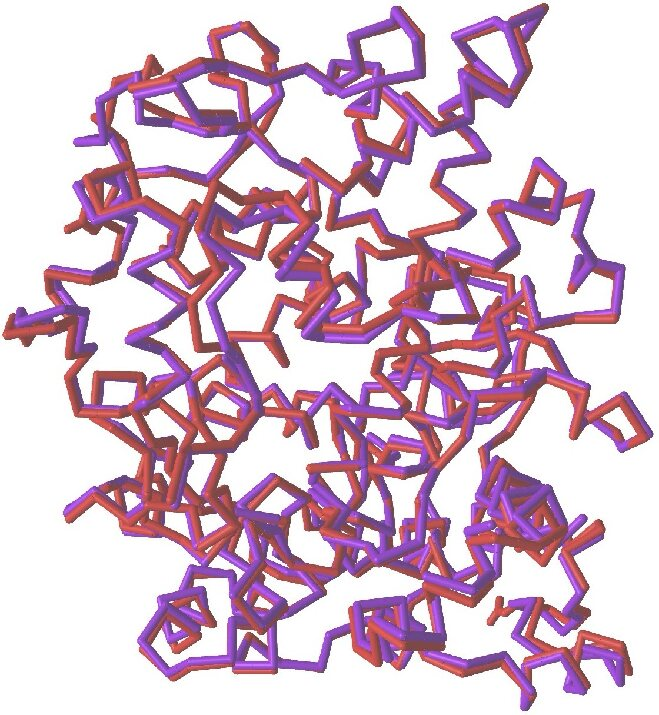
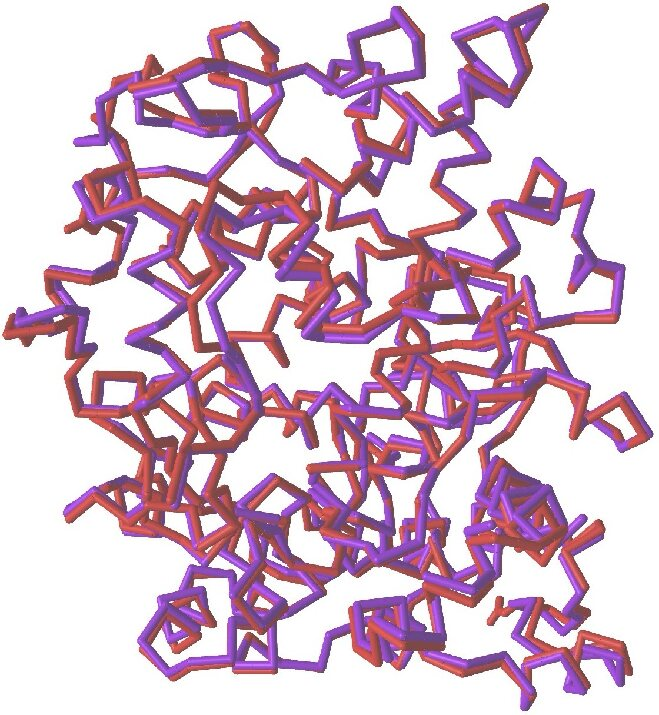

# Retrieving a 3D structure

In this section, we will retrieve the COX-2 crystal structure from the protein databank (PDB). After that, the protein `.pdb` will be 'prepared' by adding explicit Hydrogen atoms that are lacking from the experimental structure due to resolution limitations. We will do so using LePro. 
The following steps were taken in order to retrieve our 3D structure. 

In [19]:
HOMEDIR = str(Path.home())
os.chdir(HOMEDIR)
# We need to check whether the directory is there
try:
    os.mkdir('Bioinformatics')
except:
    print("Directory already exists")
os.chdir('Bioinformatics')

Directory already exists


In [20]:
TARGET_PDB_ID = "5F1A"
LIGAND_CODE = "SAL" # SAL is cocrystallized ligand of 5F1A


In [21]:
pdbl = PDBList()
pdbl.retrieve_pdb_file(TARGET_PDB_ID, pdir=TARGET_PDB_ID)

Structure exists: '5F1A/5f1a.cif' 


'5F1A/5f1a.cif'

In [8]:
parser = MMCIFParser()
structure = parser.get_structure("TARGETPROT",'{}/{}.cif'.format(TARGET_PDB_ID,TARGET_PDB_ID.lower()))

/opt/conda/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:89: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 9002.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:89: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 9086.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:89: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 9205.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:89: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 9417.
  warnings.warn(


In [9]:
class ResSelect(Select):
    def accept_residue(self, residue):
        if residue.get_resname() == LIGAND_CODE:
            return 1
        else:
            return 0

class NonHetSelect(Select):
    def accept_residue(self, residue):
        return 1 if residue.id[0] == " " else 0

io = PDBIO()
io.set_structure(structure)
io.save("ligand-{}.pdb".format(LIGAND_CODE), ResSelect())
io.save("protein-{}.pdb".format(TARGET_PDB_ID), NonHetSelect())


Hydrogens are added to our protein using LePro and is shown below. 
Fist the protein needs to be prepped:

In [10]:
command = '../CBR_teaching/bin/lepro protein-{}.pdb'.format(TARGET_PDB_ID)
os.system(command)
shutil.move('pro.pdb','{}_prepped.pdb'.format(TARGET_PDB_ID))

'5F1A_prepped.pdb'

In [11]:
# combine protein and ligand files
filenames = [
'{}_prepped.pdb'.format(TARGET_PDB_ID),
"ligand-{}.pdb".format(LIGAND_CODE)
]
with open('{}-complex.pdb'.format(TARGET_PDB_ID), 'w') as outfile:
    for fname in filenames:
        with open(fname) as infile:
            for line in infile:
                if not "END" in line:
                    outfile.write(line)

In [22]:
# Geript van 03-Docking, variable names veranderd

view = py3Dmol.view()
view.removeAllModels()
view.setViewStyle({'style':'outline','color':'black','width':0.1})

view.addModel(open('{}_prepped.pdb'.format(TARGET_PDB_ID),'r').read(),format='pdb')
Prot=view.getModel()
Prot.setStyle({'cartoon':{'arrows':True, 'tubes':True, 'style':'oval', 'color':'white'}})
view.addSurface(py3Dmol.VDW,{'opacity':0.6,'color':'white'})

ligtmp = 'ligand-{}.pdb'.format(LIGAND_CODE)
view.addModels(open(ligtmp,'r').read(),format='pdb')
ref_m = view.getModel()
ref_m.setStyle({},{'stick':{'colorscheme':'magentaCarbon','radius':0.2}})

# view.setStyle({'stick': {'colorscheme':'cyanCarbon'}})

view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In the viewer above, the `5F1A` structure and co-crystallized ligand 'SAL' can be observed. Currently, there are two copies of each protein and ligand present, due to COX-2 being crystallized as a homodimer in the experimental structure. We will deal with that later (in the Docking notebook). 

In the current viewer, the Hydrogen atoms are not visualized explicitly. In the viewer below, a different visualization ('stick model') is given, where the Hydrogen atoms are visualized in red. In this way, we can verify that the protonation by LePro was successful.

In [23]:
# Geript van 03-Docking, variable names veranderd

view = py3Dmol.view()
view.removeAllModels()
view.setViewStyle({'style':'outline','color':'black','width':0.1})

view.addModel(open('{}_prepped.pdb'.format(TARGET_PDB_ID),'r').read(),format='pdb')
Prot=view.getModel()
Prot.setStyle({'cartoon':{'arrows':True, 'tubes':True, 'style':'oval', 'color':'white'}})
view.addSurface(py3Dmol.VDW,{'opacity':0.6,'color':'white'})

ligtmp = 'ligand-{}.pdb'.format(LIGAND_CODE)
view.addModels(open(ligtmp,'r').read(),format='pdb')
ref_m = view.getModel()
ref_m.setStyle({},{'stick':{'colorscheme':'magentaCarbon','radius':0.2}})

view.setStyle({'stick': {'colorscheme':'cyanCarbon'}})

view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

## Off-target 401z 

These steps are performed for protein 4O1Z, which has the highest similarity to our protein, as well. 

In [24]:
OFF_TARGET_PDB_ID = "6Y3C" 
OFF_TARGET_LIGAND = "FLC"

pdbl = PDBList()
pdbl.retrieve_pdb_file(OFF_TARGET_PDB_ID, pdir=OFF_TARGET_PDB_ID)

parser = MMCIFParser()
structure = parser.get_structure("TARGETPROT",'{}/{}.cif'.format(OFF_TARGET_PDB_ID,OFF_TARGET_PDB_ID.lower()))

class ResSelect(Select):
    def accept_residue(self, residue):
        if residue.get_resname() == OFF_TARGET_LIGAND:
            return 1
        else:
            return 0

io = PDBIO()
io.set_structure(structure)
io.save("ligand-{}.pdb".format(OFF_TARGET_LIGAND), ResSelect())
io.save("protein-{}.pdb".format(OFF_TARGET_PDB_ID), NonHetSelect())

/opt/conda/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:89: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 4634.
  warnings.warn(


In [25]:
command = '../CBR_teaching/bin/lepro protein-{}.pdb'.format(OFF_TARGET_PDB_ID)
os.system(command)
shutil.move('pro.pdb','{}_prepped.pdb'.format(OFF_TARGET_PDB_ID))

'6Y3C_prepped.pdb'

In [26]:
# combine protein and ligand files
filenames = [
'{}_prepped.pdb'.format(OFF_TARGET_PDB_ID),
"ligand-{}.pdb".format(OFF_TARGET_LIGAND)
]
with open('{}-complex.pdb'.format(OFF_TARGET_PDB_ID), 'w') as outfile:
    for fname in filenames:
        with open(fname) as infile:
            for line in infile:
                if not "END" in line:
                    outfile.write(line)

In [28]:
# Geript van 03-Docking, variable names veranderd

view = py3Dmol.view()
view.removeAllModels()
view.setViewStyle({'style':'outline','color':'black','width':0.1})

view.addModel(open('{}_prepped.pdb'.format(OFF_TARGET_PDB_ID),'r').read(),format='pdb')
Prot=view.getModel()
Prot.setStyle({'cartoon':{'arrows':True, 'tubes':True, 'style':'oval', 'color':'white'}})
view.addSurface(py3Dmol.VDW,{'opacity':0.6,'color':'white'})

# view.setStyle({'stick': {'colorscheme':'cyanCarbon'}})

view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Finally, the two proteins, 5F1A and 4O1Z, are aligned and shown below. 

In [18]:
from Bio import pairwise2
from Bio.Seq import Seq 
from Bio.SeqRecord import SeqRecord
from Bio.Align import MultipleSeqAlignment

# Get the structures
PDBCODE_1 = '5F1A' # Name of the first structure
PDBCODE_2 = '4O1Z' # Name of the second structure

import requests
data = requests.get(f'https://www.ebi.ac.uk/pdbe/api/pdb/entry/molecules/{PDBCODE_1}').json()[PDBCODE_1.lower()]
SEQ1 = (data[0]['sequence'])
SEQ1 = Seq(SEQ1)

data = requests.get(f'https://www.ebi.ac.uk/pdbe/api/pdb/entry/molecules/{PDBCODE_2}').json()[PDBCODE_2.lower()]
SEQ2 = (data[0]['sequence'])
SEQ2 = Seq(SEQ2)

alignments = pairwise2.align.globalxx(SEQ1, SEQ2)

for align1, align2, score, begin, end in alignments:
    filename = "alignment.fasta"
    with open(filename, "w") as handle:
        handle.write(">SEQ1\n%s\n>SEQ2\n%s\n" % (align1, align2))

print(alignments[0])

Alignment(seqA='K--NPCCSH--PCQNR--GV-CMSVG-F--DQ-YK-CDCTRTGFY-GE-NCST-PEFLTRIK---LF---LK-PT-PNTVHY--I--L-THFKGF-WNVVNNIPFLR----NA--I----MSY--VLTS-RSH-LID-SPPTYN-A-DYGYK-SWEA-FSNL-SYYTRA-LPP-VPD-DCPTPL-GV-KGKKQLPDSNEIV-EK-L----LLRRKFIPDPQGS-NM-MFAFFAQHFTHQFFKTDH--KR-GPA-FTNG--LGHGVDLN-HIYGET--LA-RQRK--LRLFKDGKM-KYQIID---GEM-YPPT-VKDTQAE-----MI-YP---PQVPEHLRF----AVGQEVFGLV-PGLMM-YATIWLREHNRVCDVL-KQ-EHPE-WGDEQLFQTS-RLILIGETIKIVIED-YVQH-LSGYHFKL--KFDPELLFNK--QFQYQ-NRIAA-EFNT-LYHWHPLL-PDT-F----QIHDQKYN-YQ-QFIYN--N-SIL-LEH---GITQFVES-----FT-RQI-AGRVA-GG-RN-------VPPAVQK-VSQASIDQ--SRQMKY----QS-FNEYRKRF-MLKPYE-SFE-ELTGEKEMSA-ELEA-LYGDIDAVEL--YPA-LLV-EKPR--PDA--IFGET-MV-EV-GAPFSLKGLM-GNV-ICSPA-YWKP-STFGGEVGFQIIN---TASIQS-LI----CN-NV-KG-CPFT--SFS-VPD----------------', seqB='-PVNPCC--YYPCQ--HQG-IC--V-RFGLD-RY-QCDCTRTG-YSG-PNC-TIPE----I-WTWL-RTTL-RP-SP-----SFIHFLLTH--G-RW--------L-WDFVNATFIRDTLM--RLVLT-VRS-NLI-PSPPTYNIAHD--Y-ISWE-SFSN-VSYYTR-IL-PSVP-RDCPTP-MG-TKGKKQLPD-----AE-FLSRRFLLRRKFIPDPQG-TN

NCBI is used for the structure alignment, which is shown in figure 3[14]

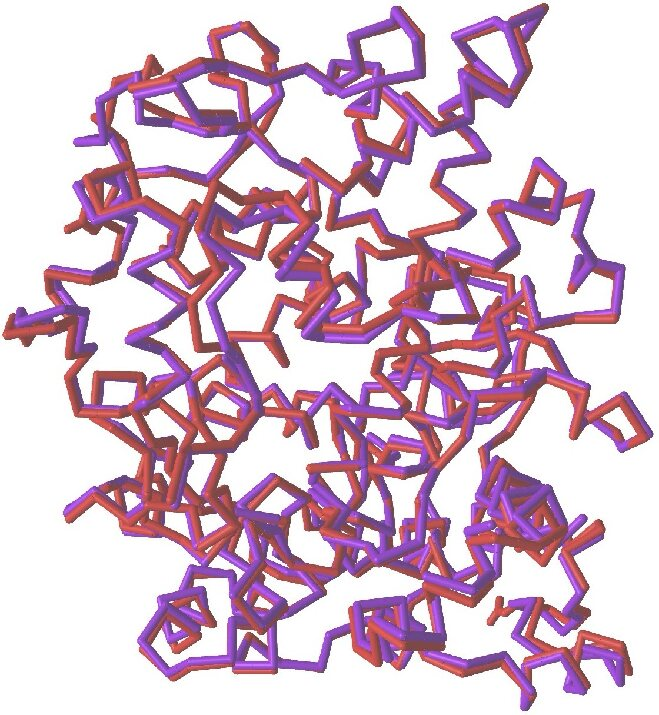

**Figure 3.** Structure alignment of human cyclo-oxygenase 1 and human cyclo-oxygenase 2.


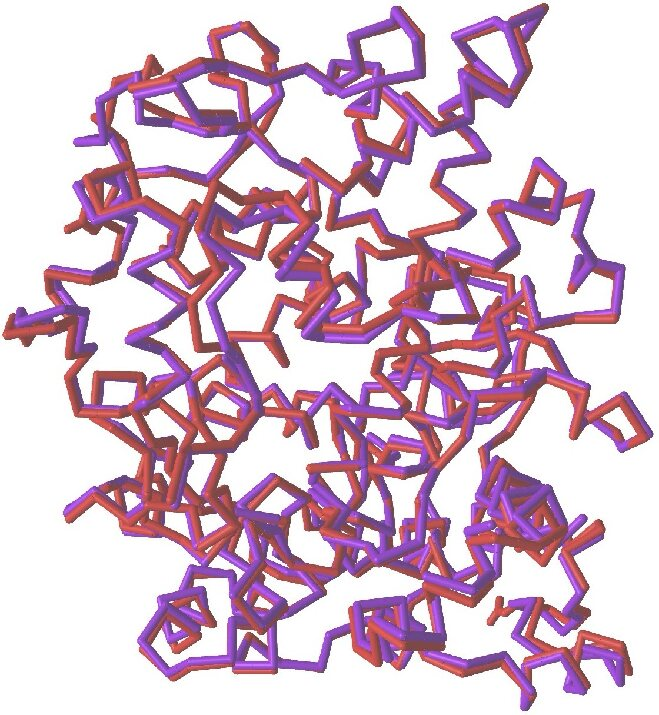

# References

1) Husband, M. & Mehta, V. Cyclo-oxygenase-2 inhibitors. Continuing Education in Anaesthesia Critical Care & Pain 13, 131–135 (2013).

2) Nørregaard, R., Kwon, T.-H. & Frøkiær, J. Physiology and pathophysiology of cyclooxygenase-2 and prostaglandin E2 in the kidney. Kidney Res Clin Pract 34, 194–200 (2015).

3) Malik, K. & Dua, A. Prostaglandins. in StatPearls (StatPearls Publishing, Treasure Island (FL), 2024).

4) Hata, A. N. & Breyer, R. M. Pharmacology and signaling of prostaglandin receptors: multiple roles in inflammation and immune modulation. Pharmacol Ther 103, 147–166 (2004).

5) Cebola, I. & Peinado, M. A. Epigenetic deregulation of the COX pathway in cancer. Prog Lipid Res 51, 301–313 (2012). 

6) Cyclo-oxygenase-2: pharmacology, physiology, biochemistry and relevance to NSAID therapy - PMC. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1571744/.
7) Rouzer, C. A. & Marnett, L. J. Cyclooxygenases: structural and functional insights. J Lipid Res 50, S29–S34 (2009).

8) Cyclooxygenases: structural, cellular, and molecular biology - PubMed. https://pubmed.ncbi.nlm.nih.gov/10966456/.

9) Hla, T. & Neilson, K. Human cyclooxygenase-2 cDNA. Proc Natl Acad Sci U S A 89, 7384–7388 (1992).

10) Qureshi, O. & Dua, A. COX Inhibitors. in StatPearls (StatPearls Publishing, Treasure Island (FL), 2024).

11) UniProt. https://www.uniprot.org/.


12) BLAST | UniProt. https://www.uniprot.org/blast.

13) Examination of the pharmacokinetics and differential inhibition of cyclooxygenase isoenzymes in New Zealand white rabbits - 2023 - Journal of Veterinary Pharmacology and Therapeutics - Wiley Online Library. https://onlinelibrary.wiley.com/doi/10.1111/jvp.13105.
14) Xu, D. & Zhang, Y. Generating Triangulated Macromolecular Surfaces by Euclidean Distance Transform. PLoS ONE 4, e8140 (2009).

